[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/18lcAtxvFn51-newA-r3ZW1wcimq3PsOT?usp=sharing)

# Advanced AI: Transformers for Computer Vision

## Getting the data

In [1]:
!wget https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz
!tar -xvf flower_photos.tgz


--2024-08-05 15:18:54--  https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/jonfernandes/flowers-dataset/main/flower_photos.tgz [following]
--2024-08-05 15:18:54--  https://media.githubusercontent.com/media/jonfernandes/flowers-dataset/main/flower_photos.tgz
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 228813984 (218M) [application/octet-stream]
Saving to: ‘flower_photos.tgz’

flower_photos.tgz   100%[===================>] 218.21M  97.7MB/s    in 2.2s    

2024-08-05 15:19:00 (97.7 MB/s) - ‘flower_photos.t

In [2]:
!ls flower_photos

daisy  dandelion  LICENSE.txt  roses  sunflowers  tulips


## Using datasets

In [3]:
!pip install transformers datasets evaluate gradio huggingface_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.6/318.6 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.1/316.1 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.

In [4]:
# @title
!pip install transformers==4.24.0 datasets==2.7.1 evaluate==0.3.0 gradio==3.12.0 huggingface_hub==0.11.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.5/90.5 kB 4.9 MB/s eta 0:00:00
ERROR: Operation cancelled by user


In [4]:
from datasets import load_dataset
ds = load_dataset('imagefolder', data_dir='flower_photos')
print(ds)

Resolving data files:   0%|          | 0/3671 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3670
    })
})


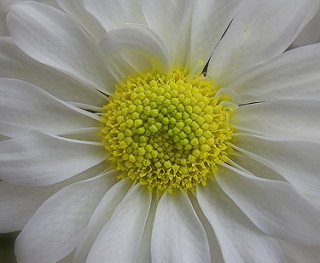

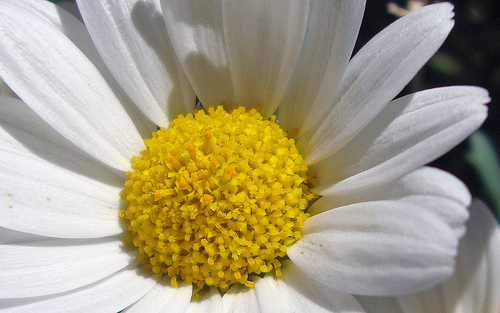

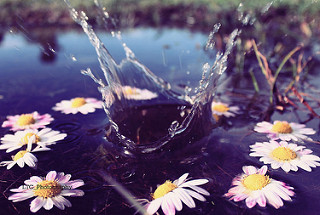

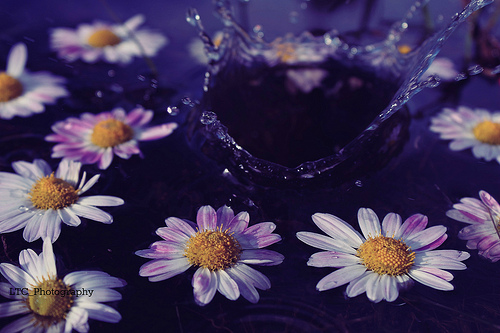

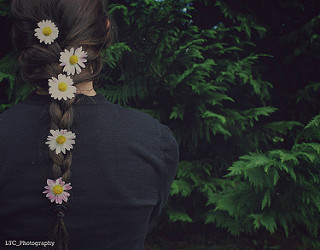

In [5]:
for i in range(5):
  display(ds['train'][i]['image'])

In [6]:
labels = ds['train'].features['label'].names
labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [7]:
ds_train_validation = ds['train'].train_test_split(test_size=0.1, seed=1, shuffle=True)
ds_train_validation

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [8]:
ds_train_validation['validation'] = ds_train_validation.pop('test')
ds_train_validation

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [9]:
ds.update(ds_train_validation)
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [10]:
ds_train_test = ds['train'].train_test_split(test_size=0.1, seed=1, shuffle=True)
ds_train_test

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2972
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 331
    })
})

In [11]:
ds.update(ds_train_test)
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2972
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 331
    })
})

## Using a pre-trained model without fine-tuning

In [12]:
from transformers import AutoModelForImageClassification, AutoFeatureExtractor
import torch
model_id = 'google/vit-base-patch16-224'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
model.eval()


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

In [13]:
feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
feature_extractor

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


ViTFeatureExtractor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTFeatureExtractor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

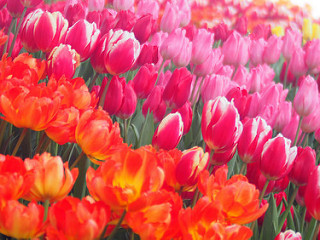

In [14]:
train_image_id = 3
one_image = ds['train'][train_image_id]['image']
one_image

In [15]:
inp = feature_extractor(images=one_image, return_tensors='pt')
inp

{'pixel_values': tensor([[[[ 0.8039,  0.8353,  0.8118,  ...,  0.9922,  1.0000,  1.0000],
          [ 0.7882,  0.6941,  0.6078,  ...,  1.0000,  1.0000,  1.0000],
          [ 0.7098,  0.5686,  0.6235,  ...,  1.0000,  1.0000,  1.0000],
          ...,
          [-0.6941, -0.7176, -0.7490,  ..., -0.2941, -0.1686,  0.2000],
          [-0.6471, -0.7569, -0.8039,  ..., -0.3804, -0.2078,  0.1843],
          [-0.6000, -0.6941, -0.8039,  ..., -0.4510, -0.2549,  0.1686]],

         [[-0.6000, -0.7098, -0.7804,  ...,  0.9922,  1.0000,  1.0000],
          [-0.7255, -0.7412, -0.7961,  ...,  1.0000,  1.0000,  1.0000],
          [-0.7569, -0.7804, -0.8118,  ...,  1.0000,  1.0000,  1.0000],
          ...,
          [-0.7255, -0.7490, -0.8118,  ..., -0.5373, -0.7961, -0.9608],
          [-0.6941, -0.7255, -0.7882,  ..., -0.5765, -0.8196, -0.9529],
          [-0.6235, -0.7176, -0.7804,  ..., -0.6000, -0.8431, -0.9686]],

         [[-0.0745, -0.1765, -0.2157,  ...,  0.9922,  1.0000,  1.0000],
          [-0

In [16]:
inp = feature_extractor(images=one_image, return_tensors='pt').to(device)
outp = model(**inp)
outp

ImageClassifierOutput(loss=None, logits=tensor([[-2.6465e-01,  2.4560e-01, -9.3033e-01, -9.0160e-02, -7.2027e-01,
         -6.9271e-01, -2.9413e-01, -1.9738e-02, -3.9560e-01, -1.5814e+00,
          6.9377e-01, -1.0876e+00, -1.6026e+00, -7.1225e-01, -8.6418e-01,
         -9.7724e-02, -1.2808e-01, -7.6168e-01,  1.7146e-03, -1.7973e+00,
         -7.6864e-01, -3.9841e-01, -1.3043e+00, -8.4577e-01, -2.6171e-01,
         -1.0951e+00, -7.4434e-01, -1.4295e+00, -1.1153e+00, -6.6912e-01,
         -1.1013e+00, -1.2263e+00, -9.7091e-01, -1.1745e+00, -6.0647e-01,
         -9.0993e-01,  1.6873e-02, -1.5615e-01, -8.8855e-01, -6.4097e-01,
         -1.4468e-01, -5.5449e-01, -7.7150e-01, -4.0527e-01,  1.2412e-02,
         -8.4242e-01, -1.1913e+00, -5.2829e-01, -1.3650e+00, -8.8367e-01,
         -1.1699e+00, -2.0226e-01, -7.4786e-01, -1.3463e+00, -1.2216e+00,
         -1.3798e+00, -1.0736e+00, -7.9586e-01, -1.2307e+00, -9.0284e-01,
          2.6091e-01, -1.3658e-01, -9.5352e-01, -7.7037e-01, -7.8705e-01

In [17]:
outp.logits.shape

torch.Size([1, 1000])

In [18]:
torch.argmax(outp.logits, dim=1)

tensor([738], device='cuda:0')

In [19]:
pred = torch.argmax(outp.logits, dim=1).item()
pred

738

In [20]:
model.config

ViTConfig {
  "_name_or_path": "google/vit-base-patch16-224",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "tench, Tinca tinca",
    "1": "goldfish, Carassius auratus",
    "2": "great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias",
    "3": "tiger shark, Galeocerdo cuvieri",
    "4": "hammerhead, hammerhead shark",
    "5": "electric ray, crampfish, numbfish, torpedo",
    "6": "stingray",
    "7": "cock",
    "8": "hen",
    "9": "ostrich, Struthio camelus",
    "10": "brambling, Fringilla montifringilla",
    "11": "goldfinch, Carduelis carduelis",
    "12": "house finch, linnet, Carpodacus mexicanus",
    "13": "junco, snowbird",
    "14": "indigo bunting, indigo finch, indigo bird, Passerina cyanea",
    "15": "robin, American robin, Turdus migratorius",
    "16": "bulbul",
 

In [21]:
model.config.id2label[pred]

'pot, flowerpot'

In [22]:
'daisy' in model.config.label2id

True

In [23]:
'rose' in model.config.label2id

False

## Defining a model

In [24]:
model_id = 'google/vit-base-patch16-224'

In [25]:
labels = ds['train'].features['label'].names
labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [26]:
id2label = {key: value for key, value in enumerate(labels)}
id2label

{0: 'daisy', 1: 'dandelion', 2: 'roses', 3: 'sunflowers', 4: 'tulips'}

In [27]:
label2id = {value:key for key, value in enumerate(labels)}
label2id

{'daisy': 0, 'dandelion': 1, 'roses': 2, 'sunflowers': 3, 'tulips': 4}

In [28]:
model = AutoModelForImageClassification.from_pretrained(model_id,
                                                        num_labels=len(labels),
                                                        id2label=id2label,
                                                        label2id=label2id,
                                                        ignore_mismatched_sizes=True
                                                        )

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Pre-processing images

In [29]:
import torchvision

from torchvision.transforms import (
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    ToTensor,
    Resize,
    CenterCrop
)

In [30]:
normalize = Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)

In [31]:
feature_extractor.size

{'height': 224, 'width': 224}

In [32]:
size = (feature_extractor.size['height'], feature_extractor.size['width'])
size

(224, 224)

In [33]:
# train_transform = Compose(
#     [
#      RandomResizedCrop(feature_extractor.size),
#      RandomHorizontalFlip(),
#      ToTensor(),
#      normalize
#     ]
# )

train_transform = Compose(
    [
     RandomResizedCrop(size),
     RandomHorizontalFlip(),
     ToTensor(),
     normalize
    ]
)

validation_transform = Compose(
        [
            Resize(size),
            CenterCrop(size),
            ToTensor(),
            normalize,
        ]
    )

def train_transform_images(images):
  images["pixel_values"] = [train_transform(image.convert("RGB")) for image in images["image"]]
  return images

def validation_transform_images(images):
  images["pixel_values"] = [validation_transform(image.convert("RGB")) for image in images["image"]]
  return images

In [34]:
transformed_ds = ds.with_transform(train_transform_images)
transformed_ds['train'] = ds['train'].with_transform(train_transform_images)
transformed_ds['validation'] = ds['validation'].with_transform(validation_transform_images)
transformed_ds['test'] = ds['test'].with_transform(validation_transform_images)

## A transformed image

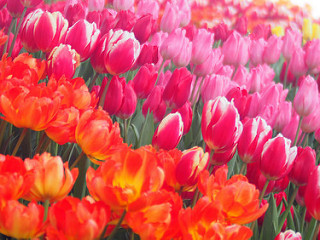

In [35]:
sample_image = ds['train'][train_image_id]['image']
sample_image

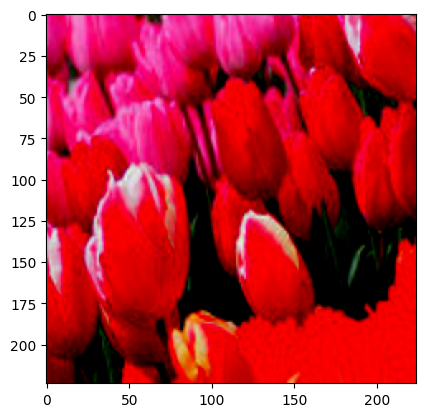

In [36]:
# Re-run cell multiple times (train_transform)
import matplotlib.pyplot as plt
transformed_sample_image = train_transform(sample_image)
plt.imshow(transformed_sample_image.permute(1, 2, 0))


In [37]:
transformed_sample_image

tensor([[[ 0.9608,  0.9529,  0.9373,  ...,  0.8745,  0.8902,  0.8745],
         [ 0.9608,  0.9529,  0.9373,  ...,  0.8431,  0.8667,  0.8667],
         [ 0.9686,  0.9608,  0.9451,  ...,  0.7882,  0.8353,  0.8510],
         ...,
         [ 0.4980,  0.4353,  0.3647,  ...,  0.9843,  0.9843,  0.9843],
         [ 0.4824,  0.4275,  0.3569,  ...,  0.9765,  0.9843,  0.9922],
         [ 0.4745,  0.4196,  0.3490,  ...,  0.9686,  0.9843,  0.9922]],

        [[ 0.1529,  0.0902,  0.0196,  ..., -0.2706, -0.2235, -0.0745],
         [ 0.1529,  0.0980,  0.0275,  ...,  0.0275,  0.0196,  0.0588],
         [ 0.1608,  0.1059,  0.0431,  ...,  0.5216,  0.4118,  0.2784],
         ...,
         [-0.9608, -0.9373, -0.9137,  ..., -0.4118, -0.3882, -0.3804],
         [-0.9686, -0.9373, -0.9059,  ..., -0.4353, -0.4196, -0.4039],
         [-0.9765, -0.9373, -0.9059,  ..., -0.4510, -0.4353, -0.4196]],

        [[ 0.5922,  0.5451,  0.4902,  ...,  0.1216,  0.1137,  0.1686],
         [ 0.5922,  0.5529,  0.5059,  ...,  0

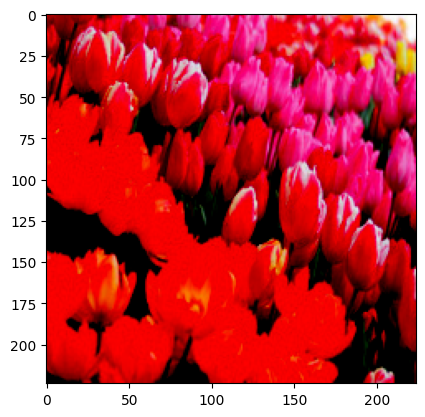

In [38]:
# Re-run cell multiple times (validation_transform)
import matplotlib.pyplot as plt
transformed_sample_image = validation_transform(sample_image)
plt.imshow(transformed_sample_image.permute(1, 2, 0))

## Getting images in the correct format

**4-images**

In [39]:
four_images = [transformed_ds['train'][i] for i in range(4)]
four_images

[{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=159x240>,
  'label': 1,
  'pixel_values': tensor([[[ 0.9765,  0.9843,  0.9922,  ..., -0.4745, -0.4745, -0.4745],
           [ 0.9529,  0.9765,  0.9922,  ..., -0.4824, -0.4824, -0.4824],
           [ 0.9529,  0.9765,  0.9922,  ..., -0.4902, -0.4902, -0.4902],
           ...,
           [-0.0667, -0.1137, -0.2000,  ..., -0.5765, -0.5686, -0.5686],
           [-0.0039, -0.0902, -0.1922,  ..., -0.5686, -0.5686, -0.5686],
           [ 0.0510, -0.0510, -0.1843,  ..., -0.5608, -0.5686, -0.5686]],
  
          [[ 0.9529,  0.9686,  0.9765,  ..., -0.1843, -0.1843, -0.1843],
           [ 0.9451,  0.9686,  0.9843,  ..., -0.1843, -0.1843, -0.1843],
           [ 0.9451,  0.9686,  0.9843,  ..., -0.1843, -0.1843, -0.1843],
           ...,
           [-0.0196, -0.0745, -0.1529,  ..., -0.2314, -0.2392, -0.2471],
           [ 0.0196, -0.0667, -0.1686,  ..., -0.2314, -0.2392, -0.2471],
           [ 0.0431, -0.0588, -0.1765,  ..., -0.2392, -

In [40]:
print(four_images[0]['pixel_values'].shape, four_images[1]['pixel_values'].shape, four_images[2]['pixel_values'].shape, four_images[3]['pixel_values'].shape)

torch.Size([3, 224, 224]) torch.Size([3, 224, 224]) torch.Size([3, 224, 224]) torch.Size([3, 224, 224])


In [41]:
four_images_labels = [image['label'] for image in four_images]
four_images_labels

[1, 4, 1, 4]

In [42]:
import torch
four_images_labels = torch.tensor([image['label'] for image in four_images])
four_images_labels

tensor([1, 4, 1, 4])

In [ ]:
#will get an error
four_images_pixel_values = torch.tensor([image['pixel_values'] for image in four_images])
four_images_pixel_values

ValueError: ignored

In [43]:
four_images_pixel_values = torch.cat([image['pixel_values'] for image in four_images])
four_images_pixel_values

tensor([[[ 0.9765,  0.9843,  0.9922,  ..., -0.4745, -0.4745, -0.4745],
         [ 0.9529,  0.9765,  0.9922,  ..., -0.4824, -0.4824, -0.4824],
         [ 0.9529,  0.9765,  0.9922,  ..., -0.4902, -0.4902, -0.4902],
         ...,
         [-0.0667, -0.1137, -0.2000,  ..., -0.5765, -0.5686, -0.5686],
         [-0.0039, -0.0902, -0.1922,  ..., -0.5686, -0.5686, -0.5686],
         [ 0.0510, -0.0510, -0.1843,  ..., -0.5608, -0.5686, -0.5686]],

        [[ 0.9529,  0.9686,  0.9765,  ..., -0.1843, -0.1843, -0.1843],
         [ 0.9451,  0.9686,  0.9843,  ..., -0.1843, -0.1843, -0.1843],
         [ 0.9451,  0.9686,  0.9843,  ..., -0.1843, -0.1843, -0.1843],
         ...,
         [-0.0196, -0.0745, -0.1529,  ..., -0.2314, -0.2392, -0.2471],
         [ 0.0196, -0.0667, -0.1686,  ..., -0.2314, -0.2392, -0.2471],
         [ 0.0431, -0.0588, -0.1765,  ..., -0.2392, -0.2471, -0.2471]],

        [[ 1.0000,  1.0000,  0.9843,  ...,  0.0431,  0.0431,  0.0431],
         [ 0.9608,  0.9765,  0.9922,  ...,  0

In [44]:
four_images_pixel_values.shape

torch.Size([12, 224, 224])

In [45]:
four_images_pixel_values = torch.stack([image['pixel_values'] for image in four_images])
four_images_pixel_values.shape

torch.Size([4, 3, 224, 224])

In [46]:
from torch.utils.data import DataLoader

def collate_fn(images):
  labels = torch.tensor([image['label'] for image in images])
  pixel_values = torch.stack([image['pixel_values'] for image in images])
  return {'pixel_values': pixel_values, 'labels': labels}

train_dataloader = DataLoader(transformed_ds['train'], batch_size=4, collate_fn=collate_fn, shuffle=True)
validation_dataloader = DataLoader(transformed_ds['validation'], batch_size=4, collate_fn=collate_fn, shuffle=False)
test_dataloader = DataLoader(transformed_ds['test'], batch_size=4, collate_fn=collate_fn, shuffle=False)

In [47]:
batch = next(iter(train_dataloader))

for key, value in batch.items():
  print(key, value.shape)

pixel_values torch.Size([4, 3, 224, 224])
labels torch.Size([4])


## Training arguments

In [48]:
from transformers import TrainingArguments, Trainer

batch_size=32
metric_name = "accuracy"
model_name = 'vit-base-patch16-224-finetuned-flower'

args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=3,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs',
    push_to_hub=True
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1494: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [49]:
from huggingface_hub import notebook_login
notebook_login()

In [50]:
!git config --global credential.helper store

## Model Training

In [51]:
args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=1,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs',
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=transformed_ds['train'],
    eval_dataset=transformed_ds['validation'],
    tokenizer=feature_extractor,
    data_collator=collate_fn,
)

trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1494: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Step,Training Loss,Validation Loss


TrainOutput(global_step=93, training_loss=0.3132745681270476, metrics={'train_runtime': 115.8245, 'train_samples_per_second': 25.66, 'train_steps_per_second': 0.803, 'total_flos': 2.303123856192553e+17, 'train_loss': 0.3132745681270476, 'epoch': 1.0})

In [52]:
trainer.predict(transformed_ds['test'])

PredictionOutput(predictions=array([[-1.9852293 , -1.095773  , -0.35558924, -1.3510041 ,  5.292792  ],
       [-0.5018691 ,  4.8978677 , -2.6724212 , -0.54422337, -1.761288  ],
       [-0.4328641 , -1.3676938 , -0.5310348 , -1.2838148 ,  3.5618336 ],
       ...,
       [-1.2550373 ,  0.04764023,  1.4180408 , -0.72661614, -0.78549266],
       [-0.7613352 , -1.3403744 ,  3.970961  , -0.58361346, -0.15325081],
       [-0.77826667,  5.6925654 , -1.6332314 , -1.5544975 , -1.4327911 ]],
      dtype=float32), label_ids=array([4, 1, 4, 1, 0, 1, 4, 1, 3, 3, 3, 3, 4, 0, 2, 0, 3, 1, 4, 2, 0, 4,
       3, 3, 3, 2, 4, 1, 0, 3, 1, 0, 1, 1, 4, 1, 2, 0, 4, 3, 0, 3, 4, 4,
       0, 3, 1, 4, 1, 3, 1, 0, 2, 4, 1, 0, 4, 3, 3, 3, 0, 1, 4, 0, 1, 4,
       2, 4, 2, 0, 3, 0, 4, 1, 3, 3, 4, 3, 4, 3, 3, 1, 0, 2, 4, 3, 4, 1,
       4, 0, 1, 4, 0, 0, 1, 1, 0, 1, 0, 4, 2, 4, 4, 4, 0, 3, 2, 1, 4, 4,
       4, 4, 4, 1, 3, 0, 2, 2, 4, 0, 0, 4, 0, 2, 4, 3, 4, 1, 3, 0, 1, 1,
       4, 3, 0, 1, 0, 2, 3, 2, 2, 2, 2, 4, 4

From the [evaluate documentation](https://huggingface.co/docs/evaluate/a_quick_tour#compute):

```
metric.compute(
          references=...,
          predictions=...)
```

In [53]:
import evaluate
import numpy as np

metric = evaluate.load('accuracy')

def compute_metrics(batch):
  return metric.compute(
      references=batch.label_ids,
      predictions=np.argmax(batch.predictions, axis=1))

In [54]:
args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=5,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs',
    push_to_hub=True
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=transformed_ds['train'],
    eval_dataset=transformed_ds['validation'],
    tokenizer=feature_extractor,
    data_collator=collate_fn,
    compute_metrics=compute_metrics
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1494: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [55]:
%load_ext tensorboard
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [56]:
trainer.train()
trainer.save_model()

Step,Training Loss,Validation Loss


In [57]:
trainer.evaluate(transformed_ds['train'])

{'eval_loss': 0.035004399716854095,
 'eval_accuracy': 0.9895693135935397,
 'eval_runtime': 43.3432,
 'eval_samples_per_second': 68.569,
 'eval_steps_per_second': 2.146,
 'epoch': 5.0}

In [58]:
trainer.evaluate(transformed_ds['validation'])

{'eval_loss': 0.10314648598432541,
 'eval_accuracy': 0.9754768392370572,
 'eval_runtime': 5.3092,
 'eval_samples_per_second': 69.126,
 'eval_steps_per_second': 2.26,
 'epoch': 5.0}

In [59]:
trainer.evaluate(transformed_ds['test'])

{'eval_loss': 0.07576358318328857,
 'eval_accuracy': 0.9758308157099698,
 'eval_runtime': 4.7429,
 'eval_samples_per_second': 69.789,
 'eval_steps_per_second': 2.319,
 'epoch': 5.0}

## Inference in notebook

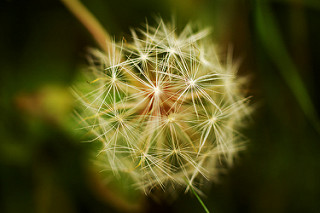

In [60]:
test_image = ds['test'][-1]['image']
test_image

In [65]:
import torch
from transformers import AutoModelForImageClassification, AutoFeatureExtractor

model_id = f'onlyumangsri/vit-base-patch16-224-finetuned-flower'

def classify_image(image):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt').to(device)
  outp = model(**inp)
  pred = torch.argmax(outp.logits, dim=-1).item()
  return model.config.id2label[pred]

classify_image(test_image)

'dandelion'

In [64]:
import torch

model_id = f'onlyumangsri/vit-base-patch16-224-finetuned-flower'

def classify_image(image):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt').to(device)
  outp = model(**inp)
  pred = torch.nn.functional.softmax(outp.logits, dim=-1)
  preds = pred[0].cpu().detach().numpy()
  confidence = {label: float(preds[i]) for i, label in enumerate(labels)}
  return confidence

classify_image(test_image)

{'daisy': 7.752716919640079e-05,
 'dandelion': 0.999809205532074,
 'roses': 3.8163216231623664e-05,
 'sunflowers': 4.056684338138439e-05,
 'tulips': 3.455662590567954e-05}

In [63]:
from transformers import pipeline

model_id = f'onlyumangsri/vit-base-patch16-224-finetuned-flower'
feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)

image_classifier = pipeline('image-classification', model=model_id, feature_extractor=feature_extractor, framework="pt")
image_classifier(test_image)

preprocessor_config.json:   0%|          | 0.00/327 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/839 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


[{'label': 'dandelion', 'score': 0.9998093247413635},
 {'label': 'daisy', 'score': 7.752718374831602e-05},
 {'label': 'sunflowers', 'score': 4.056693069287576e-05},
 {'label': 'roses', 'score': 3.816325624939054e-05},
 {'label': 'tulips', 'score': 3.455669866525568e-05}]

## Inference on your phone using Gradio

In [66]:
!wget https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-1.jpeg
!wget https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-2.jpeg

--2024-08-05 16:12:52--  https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-1.jpeg
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/main/flower-1.jpeg [following]
--2024-08-05 16:12:53--  https://raw.githubusercontent.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/main/flower-1.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 180993 (177K) [image/jpeg]
Saving to: ‘flower-1.jpeg’

flower-1.jpeg       100%[===================>] 176.75K  --.-KB/s    in 0.02s   

2024-08-05 16:12:53 

In [67]:
!ls -l

total 223828
-rw-r--r-- 1 root   root    180993 Aug  5 16:12 flower-1.jpeg
-rw-r--r-- 1 root   root    182353 Aug  5 16:12 flower-2.jpeg
drwxr-x--- 7 270850 5000      4096 Feb 10  2016 flower_photos
-rw-r--r-- 1 root   root 228813984 Aug  5 15:18 flower_photos.tgz
drwxr-xr-x 2 root   root      4096 Aug  5 16:06 logs
drwxr-xr-x 1 root   root      4096 Aug  1 13:24 sample_data
drwxr-xr-x 4 root   root      4096 Aug  5 16:05 vit-base-patch16-224-finetuned-flower


In [68]:
import torch
from transformers import AutoModelForImageClassification, AutoFeatureExtractor
import gradio as gr

model_id = f'onlyumangsri/vit-base-patch16-224-finetuned-flower'
labels = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

def classify_image(image):
  model = AutoModelForImageClassification.from_pretrained(model_id)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt')
  outp = model(**inp)
  pred = torch.nn.functional.softmax(outp.logits, dim=-1)
  preds = pred[0].cpu().detach().numpy()
  confidence = {label: float(preds[i]) for i, label in enumerate(labels)}
  return confidence

interface = gr.Interface(fn=classify_image,
                         inputs='image',
                         examples=['flower-1.jpeg', 'flower-2.jpeg'],
                         outputs='label').launch(debug=True, share=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://ed9d0a0e8928ed6c5b.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://ed9d0a0e8928ed6c5b.gradio.live
